# **Projeto Final** - SME5924 - Processos Dinâmicos em Redes Complexas

**Tema:** ***Como estudar a arte usando redes?***

**Descrição:** *A Dinâmica de Influências na História da Arte*

**Aluno:** José Eduardo Saroba Bieco <br/>
**NUSP:** 15856890

---

## 1. Introdução e Motivação

A história da arte é frequentemente estudada de forma linear, organizada cronologicamente por movimentos e períodos. No entanto, a evolução artística é fundamentalmente um processo dinâmico impulsionado pela troca de ideias e técnicas entre indivíduos. A adoção de um novo estilo ou vanguarda artística apresenta características de contágio social e difusão de informação. 

O objetivo deste trabalho é modelar a história da arte europeia e global como uma rede complexa direcionada, onde os nós representam os pintores e as arestas representam as relações de influência (mestre-aprendiz ou inspiração). A partir dessa topologia, buscamos analisar as métricas de centralidade, identificar comunidades que correspondam aos movimentos artísticos e, finalmente, aplicar o modelo epidêmico SIR para simular como um novo estilo artístico se propagaria pela rede ao longo do tempo.

## 2. Configuração do Ambiente

Para a execução das análises topológicas e simulações, utilizamos as bibliotecas `networkx` (para modelagem e métricas de grafos), `powerlaw` (para o cálculo da distribuição de grau) e `ndlib` (específica para simulação de processos dinâmicos e epidêmicos em redes).

In [124]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import numpy as np
import collections
import powerlaw
from networkx.algorithms import community
import ndlib.models.epidemics as ep
import ndlib.models.ModelConfig as mc
import copy
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
from collections import Counter

### 2.1. Remoção de Movimentos Artísticos nas Conexões

Como o objetivo do projeto é mapear uma rede direcional de influências estritamente entre artistas, permitir que o `NetworkX` transforme os **movimentos artísticos** em nós criaria entidades "fantasmas" e conexões estruturalmente incorretas no grafo (ex: Artista A influenciando um conceito abstrato).

In [125]:
# Extrair todos os movimentos e estilos do dataset para criar uma "lista de proibições"
# Para acelerar o processo, fiz uma amostragem de diversos termos presentes no campo Artista após a criação da rede
# e pedi para o Gemini adicionar termos semelhantes/relacionados/possíveis.
estilos_a_serem_removidos = {
    'Abstract Art', 'Abstract Expressionism', 'Academicism', 'Action painting',
    'Art Deco', 'Art Nouveau', 'Arte Povera', 'Arts and Crafts', 'Ashcan School',
    'Baroque', 'Bauhaus', 'Byzantine', 'Cloisonnism', 'Color Field Painting',
    'Conceptual Art', 'Constructivism', 'Contemporary Art', 'Cubism', 'Dada',
    'Dadaism', 'De Stijl', 'Divisionism', 'Early Christian', 'Early Renaissance',
    'Expressionism', 'Fauvism', 'Gothic', 'Hard-edge painting', 'High Renaissance',
    'Hudson River School', 'Impressionism', 'Kinetic Art', 'Land Art', 'Luminism',
    'Lyrical Abstraction', 'Macchiaioli', 'Magic Realism', 'Mannerism', 
    'Metaphysical art', 'Minimalism', 'Naïve Art', 'Neoclassicism', 
    'Neo-Impressionism', 'Northern Renaissance', 'Op Art', 'Outsider Art',
    'Pointillism', 'Pop Art', 'Post-Impressionism', 'Precisionism', 'Primitivism',
    'Purism', 'Realism', 'Renaissance', 'Rococo', 'Romanticism', 'Shin-hanga',
    'Sosaku-hanga', 'Suprematism', 'Surrealism', 'Symbolism', 'Synthetism',
    'Tachisme', 'Tonalism', 'Ukiyo-e', 'male-portraits', 'female-portraits', 
    'religious-painting', 'landscape', 'genre-painting', '132 x 96.1 cm',
    'streets-and-squares', 'allegories-and-symbols',
    'famous-people', 'forests-and-trees', 'animals', 'rivers-and-waterfalls', 
    'mountains', 'roads-and-vehicles', 'characters-and-emotions', 
    'boats-and-ships', 'houses-and-buildings', 'countryside', 'winter',
    'spring', 'summer', 'autumn', 'fall', 'rain', 'snow', 'storm',
    'seascapes', 'cityscapes', 'skyscapes', 'landscapes', 'moonscapes',
    'flowers-and-plants', 'birds', 'wildlife', 'pets', 'insects',
    'nudes', 'nude-painting', 'self-portraits', 'children', 'family', 
    'female-portraits', 'male-portraits', 'group-portraits',
    'still-life', 'interiors', 'everyday-life', 'domestic-settings', 
    'work-and-occupations', 'sports-and-games', 'music-and-instruments',
    'mythological-characters', 'religious-characters', 'battle-scenes', 
    'historical-events', 'angels-and-demons', 'saints-and-apostles',
    'castles', 'churches', 'bridges', 'ruins', 'monuments', 'streets-and-squares',
    'abstract', 'calligraphy', 'design', 'illustration', 'posters', 'sketches-and-studies',
    'female-nude', 'male-nude', 'cliffs-and-rocks', 'gardens-and-parks', 'folk-architecture', 'night', 
    'couples', 'cottages-and-farmhouses', 'castles-and-fortresses', 
    'twilight-and-night', 'furniture-and-decoration', 'angels-and-archangels',
    'sunsets-and-sunrises', 'lakes-and-ponds', 'beaches-and-coastlines', 
    'deserts', 'caves', 'valleys', 'clouds', 'volcanoes', 'jungles', 'orchards',
    'mills-and-windmills', 'monasteries', 'palaces', 'bridges-and-viaducts', 
    'town-squares', 'harbors-and-ports', 'factories', 'ruins-and-monuments',
    'mother-and-child', 'workers', 'peasants', 'soldiers', 'musicians', 
    'dancers', 'merchants', 'royalty', 'gods-and-goddesses', 'knights',
    'fruits-and-vegetables', 'books-and-documents', 'weapons-and-armor', 
    'vases-and-containers', 'food-and-drink', 'skulls-and-bones', 'jewelry',
    'allegory', 'caricature', 'capriccio', 'veduta', 'marina', 'vanitas',
    'Jesus-Christ', 'fields-and-plains','Virgin-Mary', 'Madonna-and-Child', 'Holy-Family', 'John-the-Baptist',
    'saints-and-martyrs', 'crucifixion', 'last-supper', 'resurrection',
    'annunciation', 'baptism', 'heaven-and-hell', 'clergy','meadows-and-pastures', 'hills-and-valleys', 'marshes-and-swamps', 
    'woods-and-forests', 'paths-and-trails', 'glaciers-and-snow', 
    'canyons-and-gorges', 'cliffs-and-coasts', 'parks-and-reserves','boats-and-boating', 'horses-and-riders', 'hunting-and-fishing',
    'reading-and-writing', 'bathing-and-bathers', 'seas-and-oceans', 'families', 'France', 'Paris', 'mealtimes', 
    'horses', 'leisure-and-sleep', 'Italy', 'Rome', 'Venice', 'Florence', 'London', 'UK', 'United-Kingdom', 
    'Spain', 'Madrid', 'Germany', 'Berlin', 'Netherlands', 'Amsterdam', 
    'USA', 'New-York', 'Russia', 'Moscow', 'Japan', 'Tokyo', 'Europe', 'festivals-and-fairs', 'music-and-dance', 'banquets-and-feasts', 
    'drinking', 'smoking', 'bathing', 'reading', 'writing', 'playing',
    'working', 'resting', 'travel-and-transportation', 'processions', 'dogs', 'cats', 'cattle', 'sheep', 'pigs', 'wild-animals', 
    'birds', 'fish-and-marine-life', 'insects-and-reptiles', 'children', 'siblings', 'friends', 'crowds', 'lovers', 'weddings'
}
termos_proibidos = set(estilos_a_serem_removidos)

## 3. Os Dados: Origem e Preparação

A coleta de dados sobre relações artísticas é um desafio metodológico. Existem diversas fontes conceituadas na internet, mas cada uma apresenta limitações para a modelagem de redes:
* **Wikidata:** Embora possua dados ricos, exige o uso de uma estrutura de consulta (SPARQL) complexa, o que dificultou a extração massiva e estruturada de relações específicas.
* **MoMA (Museum of Modern Art):** Disponibiliza uma base de dados extensa, porém engloba variados tipos de arte (arquitetura, fotografia, escultura) misturados, e não fornece explicitamente o atributo relacional crucial para este estudo: a informação de "quem influenciou quem".

Por conta disso, utilizamos o dataset **PainterPalette** (disponível em: `https://github.com/me9hanics/PainterPalette`). Este repositório é fruto de um processo que combinou múltiplas fontes (incluindo WikiArt e Art500k), estruturando de forma tabular atributos biográficos, estilos, movimentos e, de maneira indispensável, as relações de influência direta.

Nesta etapa preparatória, carregamos os dados e realizamos o tratamento das variáveis. Os campos de `estilo` e `movimento` foram mesclados de colunas complementares para evitar perda de dados. O mesmo foi feito com as relações direcionais, consolidando as influências recebidas (`in_edges`) e exercidas (`out_edges`).

In [126]:
def mesclar_sem_repeticao(row, colunas, blacklist=set()):
    '''
    Função auxiliar para mesclar textos separados por vírgula, 
    removendo duplicatas, ignorando nulos e filtrando termos proibidos.
    '''
    itens_unicos = set()
    
    for col in colunas:
        valor = row[col]
        # Garante que o valor existe e é uma string antes de processar
        if pd.notna(valor) and isinstance(valor, str):
            # Divide pela vírgula, remove os espaços extras e adiciona ao conjunto matemático
            itens = [item.strip() for item in valor.split(',') if item.strip()]
            # itens_unicos.update(itens)

             # Adiciona ao conjunto apenas se o termo NÃO estiver na blacklist
            for item in itens:
                if item not in blacklist:
                    itens_unicos.add(item)
    
    # Se o conjunto não estiver vazio, junta tudo com vírgula. Se estiver, retorna nulo.
    return ', '.join(sorted(itens_unicos)) if itens_unicos else pd.NA

In [127]:
df = pd.read_csv('../data/PainterPalette.csv', low_memory=False)

In [128]:
# Extrair também os movimentos e estilos dinamicamente do dataset 
# (Para apanhar variações de texto ou sub-estilos menos conhecidos)
colunas_de_estilo_movimento = ['movement', 'Art500k_Movements', 'ArtMovement', 'styles', 'styles_extended']

for col in colunas_de_estilo_movimento:
    # Apanha todos os valores não nulos da coluna
    valores = df[col].dropna()
    for val in valores:
        if isinstance(val, str):
            # Divide estilos separados por vírgula e limpa os espaços
            itens = [item.strip() for item in val.split(',') if item.strip()]
            termos_proibidos.update(itens)

In [129]:
# Mescla movimentos: Se 'movement' for nulo, pega o valor de 'Art500k_Movements', e vice-versa com 'ArtMovement'
df['movement_merged'] = df.apply(
    lambda row: mesclar_sem_repeticao(row, ['movement', 'Art500k_Movements', 'ArtMovement']), 
    axis=1
)

# Mesclar estilos
df['styles_merged'] = df.apply(
    lambda row: mesclar_sem_repeticao(row, ['styles', 'styles_extended']), 
    axis=1
)

# Mescla de influências de ENTRADA sem repetições
df['in_edges'] = df.apply(
    lambda row: mesclar_sem_repeticao(row, ['Influencedby', 'Teachers'], blacklist=termos_proibidos), 
    axis=1
)

# Mescla de influências de SAÍDA sem repetições
df['out_edges'] = df.apply(
    lambda row: mesclar_sem_repeticao(row, ['Influencedon', 'Pupils'], blacklist=termos_proibidos), 
    axis=1
)

In [130]:
# Seleção de Features ("Redução de Dimensionalidade")
# Aqui foco estritamente nos atributos essenciais para a topologia da rede e simulações
colunas_alvo = [
    'artist',           # Identificador primário do nó
    'birth_year',       # Necessário para o recorte temporal
    'death_year',       # Necessário para saber quando o nó "sai" da rede (removido)
    'styles_merged',    # A 'doença/vírus' que vamos simular o contágio
    'movement_merged',  # Alternativa ou complemento ao estilo
    'Influencedby',     # Arestas de entrada (In-degree)
    'Influencedon',     # Arestas de saída (Out-degree)
    'in_edges',         # Arestas de entrada
    'out_edges',        # Arestas de saída
]

In [131]:
df_rede = df[colunas_alvo].copy()

# Análise de Campos Nulos
total_linhas = len(df_rede)
nulos = df_rede.isnull().sum()
perc_nulos = (nulos / total_linhas) * 100

resumo_nulos = pd.DataFrame({
    'Valores Faltantes': nulos, 
    'Percentual (%)': perc_nulos
}).sort_values('Percentual (%)', ascending=False)

# Mostra apenas as colunas que têm algum dado faltando
print(resumo_nulos[resumo_nulos['Valores Faltantes'] > 0])
print("-" * 40)

                 Valores Faltantes  Percentual (%)
Influencedon                 10058       97.075572
out_edges                     9981       96.332400
Influencedby                  9889       95.444455
in_edges                      9832       94.894315
styles_merged                 7159       69.095647
movement_merged               5635       54.386642
death_year                    2606       25.152012
birth_year                     692        6.678892
----------------------------------------


## 4. Modelagem da Rede (Topologia)

A rede foi modelada como um **Grafo Direcionado (`nx.DiGraph`)**. A direção das arestas é estritamente definida pelo fluxo da informação (ou técnica artística): se o artista A influenciou o artista B, a aresta parte de A em direção a B ($A \rightarrow B$). Essa direcionalidade é um pré-requisito fundamental para a simulação epidemiológica subsequente.

In [132]:
G = nx.DiGraph()

# Iterar sobre o dataframe para adicionar nós e arestas
for _, row in df_rede.iterrows():
    artista = row['artist']
    if pd.isna(artista):
        continue
        
    # Adiciona o nó com atributos essenciais para o modelo SIR depois
    G.add_node(
        artista, 
        birth_year=row['birth_year'],
        death_year=row['death_year'],
        style=row['styles_merged'],
        movement=row['movement_merged']
    )
    
    # Processa In-edges (Quem influenciou o artista: Origem -> Artista)
    if pd.notna(row['in_edges']):
        influenciadores = [nome.strip() for nome in row['in_edges'].split(',')]
        for influenciador in influenciadores:
            if influenciador: # Ignora strings vazias
                G.add_edge(influenciador, artista)
                
    # Processa Out-edges (Quem o artista influenciou: Artista -> Destino)
    if pd.notna(row['out_edges']):
        influenciados = [nome.strip() for nome in row['out_edges'].split(',')]
        for influenciado in influenciados:
            if influenciado:
                G.add_edge(artista, influenciado)

print(f"Rede criada! Nós: {G.number_of_nodes()} | Arestas: {G.number_of_edges()}")

Rede criada! Nós: 11863 | Arestas: 3027


## 5. Análise Topológica e Métricas de Centralidade

Com a topologia construída, calculamos as métricas de centralidade para quantificar o papel cada pintor na rede:
* **In-Degree (Grau de Entrada):** Representa a suscetibilidade do nó. Pintores com alto _In-degree_ absorveram influências de múltiplas fontes.
* **Out-Degree (Grau de Saída):** Representa a capacidade de propagação. Hubs com alto _Out-degree_ atuam como super-espalhadores de tendências.
* **PageRank:** Identifica os nós canônicos da rede. Diferente do grau, o _PageRank_ pontua alto os artistas que, mesmo tendo influenciado poucos, influenciaram outros nomes de peso.
* **Betweenness Centrality:** Identifica os gargalos ou pontes da rede. Pintores com alta intermediação são fundamentais para que um estilo transite entre clusters ou gerações diferentes.

In [133]:
# Graus (In e Out)
in_degrees = dict(G.in_degree())
out_degrees = dict(G.out_degree())

In [134]:
# PageRank (Importância na rede)
pagerank = nx.pagerank(G, alpha=0.85)

In [135]:
# Closeness Centrality (Quão perto o nó está de todos os outros)
# Obs: Em grafos direcionados, utiliza-se o reverse para saber quem propaga melhor
closeness = nx.closeness_centrality(G.reverse()) 

In [136]:
# Betweenness Centrality (Pontes entre movimentos artísticos)
betweenness = nx.betweenness_centrality(G, k=G.number_of_nodes(), seed=42)

In [137]:
df_metricas = pd.DataFrame({
    'Artista': list(G.nodes()),
    'In_Degree': [in_degrees.get(n, 0) for n in G.nodes()],
    'Out_Degree': [out_degrees.get(n, 0) for n in G.nodes()],
    'PageRank': [pagerank.get(n, 0) for n in G.nodes()],
    'Closeness': [closeness.get(n, 0) for n in G.nodes()],
    'Betweenness': [betweenness.get(n, 0) for n in G.nodes()]
})

# Ordena pelo Out-degree (maiores influenciadores da história)
df_metricas = df_metricas.sort_values(by='Out_Degree', ascending=False).reset_index(drop=True)

In [138]:
df_metricas.head()

,Artista,In_Degree,Out_Degree,PageRank,Closeness,Betweenness
0,Isaac Levitan,147,117,0.009131,0.004678,0.000952
1,Alexander Ivanov,1,41,0.000108,0.007077,0.000518
2,Umberto Boccioni,4,28,0.000287,0.008739,0.000378
3,Paul Cezanne,6,20,0.000238,0.008707,0.000034
4,Caravaggio,2,18,0.000097,0.012762,0.000006


### 5.1. Transitividade e Aglomeração 
* **Transitividade:** O valor obtido indica a probabilidade de que dois pintores que compartilham uma conexão com um terceiro pintor também influenciem um ao outro diretamente. Na história da arte, uma alta transitividade sugere comunidades fechadas (ex: ateliês onde todos trocam técnicas entre si).
* **Coeficiente de Aglomeração Médio:** Este valor reflete a tendência local de formação de triângulos de influência. Redes sociais e de colaboração costumam ter esse valor alto, indicando a forte presença de "escolas" ou movimentos artísticos coesos.

In [139]:
# Calcula a transitividade global da rede
# (Mede a fração de triângulos possíveis que estão fechados)
transitividade = nx.transitivity(G)

# Calcula o coeficiente de aglomeração médio (Average Clustering)
# (Mede a tendência dos vizinhos de um nó estarem conectados entre si)
clustering_medio = nx.average_clustering(G)

print(f"Transitividade da rede: {transitividade:.4f}")
print(f"Coeficiente de Aglomeração Médio: {clustering_medio:.4f}")

Transitividade da rede: 0.0096
Coeficiente de Aglomeração Médio: 0.0021


### 5.2. Densidade da Rede

A densidade de uma rede direcionada quantifica a proporção de arestas existentes em relação ao número total de arestas possíveis. Matematicamente, para um grafo direcionado com $V$ vértices e $E$ arestas, a densidade $D$ é calculada por:

$$D = \frac{E}{V(V-1)}$$

Onde $0 \le D \le 1$. Em redes sociais e históricas, é esperado encontrarmos redes extremamente **esparsas** (baixa densidade), visto que a restrição temporal e geográfica impede que um artista se conecte com a maioria global da rede.

In [140]:
def calcular_densidade(G):
    # O NetworkX já aplica a fórmula correta dependendo se o grafo é DiGraph ou Graph
    densidade = nx.density(G)
    
    # Conferência manual para fins didáticos:
    V = G.number_of_nodes()
    E = G.number_of_edges()
    densidade_manual = E / (V * (V - 1)) if V > 1 else 0
    
    print("--- DENSIDADE DA REDE ---")
    print(f"Nós (V): {V}")
    print(f"Arestas (E): {E}")
    print(f"Arestas Possíveis: {V * (V - 1)}")
    print(f"Densidade (NetworkX): {densidade:.6f}")
    
    # Interpretação
    if densidade < 0.1:
        print("Classificação: Rede altamente esparsa.")
    else:
        print("Classificação: Rede densa.")

In [141]:
calcular_densidade(G)

--- DENSIDADE DA REDE ---
Nós (V): 11863
Arestas (E): 3027
Arestas Possíveis: 140718906
Densidade (NetworkX): 0.000022
Classificação: Rede altamente esparsa.


## 6. Caracterização da Rede: Lei de Potência

A distribuição de grau é uma métrica definidora do comportamento global da rede. Redes sociais e biológicas frequentemente apresentam uma topologia Livre de Escala (*Scale-Free*), onde a distribuição da probabilidade do grau decai seguindo uma lei de potência ($P(k) \sim k^{-\gamma}$).

Para validar se a rede de pintores possui essa característica, plotamos a distribuição do grau de saída (_Out-degree_) em escala log-log e utilizamos a Estimativa de Máxima Verossimilhança (MLE) via biblioteca `powerlaw` para calcular o expoente $\gamma$. A presença de uma topologia *Scale-Free* indica que processos epidêmicos na rede não possuem um limiar crítico, facilitando a difusão rápida a partir dos "hubs".

In [142]:
def plotar_distribuicao_grau_loglog(G):
    # Ignoro nós com grau 0, pois log(0) é indefinido
    out_degrees = [d for n, d in G.out_degree() if d > 0]
    
    if not out_degrees:
        print("Erro: A rede não possui arestas de saída para plotar.")
        return
        
    # Contar a frequência P(k) de cada grau k
    contagem_graus = collections.Counter(out_degrees)
    graus, frequencias = zip(*contagem_graus.items())

    plt.figure(figsize=(10, 6))
    plt.loglog(graus, frequencias, marker='o', linestyle='None', color='#e74c3c', alpha=0.7, markersize=8)

    plt.title('Distribuição de Out-Degree (Lei de Potência)', fontsize=16, fontweight='bold')
    plt.xlabel('Grau $k$ (Número de artistas influenciados)', fontsize=14)
    plt.ylabel('Frequência $P(k)$ (Número de pintores)', fontsize=14)
    
    plt.grid(True, which="both", ls="--", alpha=0.4)
             
    plt.tight_layout()
    plt.show()

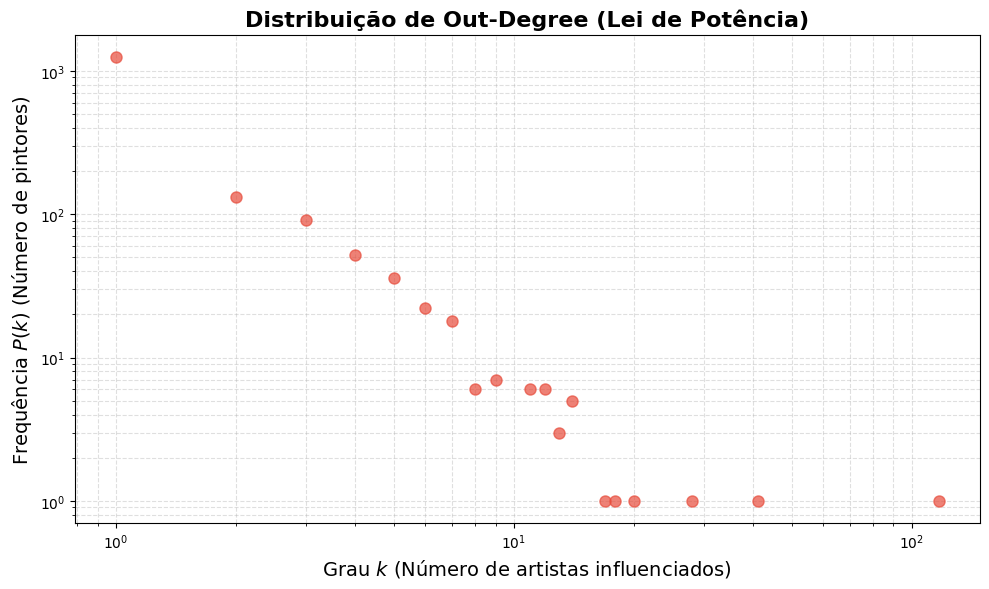

In [143]:
plotar_distribuicao_grau_loglog(G)

In [144]:
def analisar_lei_de_potencia(G):
    # Extrair os graus de saída (maiores que zero)
    out_degrees = [d for n, d in G.out_degree() if d > 0]
    
    # Ajustar o modelo usando MLE (Maximum Likelihood Estimation)
    # A biblioteca encontra o k_min ótimo automaticamente
    fit = powerlaw.Fit(out_degrees, discrete=True)
    
    gamma = fit.alpha
    k_min = fit.xmin
    
    print("--- RESULTADOS DA ESTIMATIVA MLE ---")
    print(f"Expoente Gamma (γ): {gamma:.4f}")
    print(f"Grau mínimo para a lei (k_min): {k_min}")
    
    # Teste de Hipótese (Loglikelihood Ratio)
    # Compara a Lei de Potência com uma distribuição Lognormal
    # Um R positivo indica que a lei de potência é um ajuste melhor
    R, p_value = fit.distribution_compare('power_law', 'lognormal', normalized_ratio=True)
    
    print("\n--- TESTE DE ROBUSTEZ ---")
    print(f"Loglikelihood Ratio (R): {R:.4f}")
    print(f"P-valor: {p_value:.4e}")
    
    if R > 0 and p_value < 0.05:
        print("Conclusão: A rede é ESTATISTICAMENTE Scale-Free (Lei de Potência é o melhor ajuste).")
    elif R < 0 and p_value < 0.05:
        print("Conclusão: A distribuição Lognormal explica melhor os dados do que a Lei de Potência.")
    else:
        print("Conclusão: Empate estatístico. Não é possível descartar nenhuma das duas (comum em redes pequenas).")

    return fit

In [145]:
analisar_lei_de_potencia(G)

Calculating best minimal value for power law fit


Fitting xmin: 100%|██████████| 17/17 [00:00<00:00, 592.35it/s]

--- RESULTADOS DA ESTIMATIVA MLE ---
Expoente Gamma (γ): 2.4636
Grau mínimo para a lei (k_min): 1.0

--- TESTE DE ROBUSTEZ ---
Loglikelihood Ratio (R): -5.4639
P-valor: 4.6590e-08
Conclusão: A distribuição Lognormal explica melhor os dados do que a Lei de Potência.



c:\Users\jo_bi\AppData\Local\Programs\Python\Python312\Lib\site-packages\powerlaw\distributions.py:743: OptimizeWarning: Initial guess is not within the specified bounds
  result = scipy.optimize.minimize(fit_function,


## 7. Componente Gigante e Comunidades

Como a rede contém ilhas isoladas de informação, qualquer simulação iniciada fora do componente principal não apresentaria propagação. Em grafos direcionados temporais, utiliza-se a conexão fraca (*weakly connected*) para extrair "o componente principal".

Em seguida, aplicamos o **Método de Louvain** para detecção de comunidades, otimizando a métrica de modularidade ($Q$). O objetivo desta etapa é avaliar se as partições topológicas geradas puramente pela matemática estrutural do grafo correspondem empiricamente aos movimentos artísticos reais registrados na história da arte.

In [146]:
def plot_influence_network(G, top_n=200, ego_node=None, figsize=(16, 12)):
    """
    Plota a rede de influências aplicando filtros para evitar o problema de 'hairball'.
    
    Parâmetros:
    -----------
    G : nx.DiGraph
        O grafo direcionado do NetworkX.
    top_n : int
        Número máximo de nós para plotar, filtrados pelos de maior grau (In + Out).
    ego_node : str
        Se preenchido (ex: 'Pablo Picasso'), plota apenas a vizinhança desse pintor (raio 1 e 2).
    figsize : tuple
        Tamanho da figura do matplotlib.
    """
    
    if ego_node and ego_node in G.nodes():
        # Ego-network: Pega o pintor e quem está ligado a ele até 2 saltos de distância
        ego_graph = nx.ego_graph(G, ego_node, radius=2, undirected=False)
        sub_g = ego_graph
        title = f"Rede de Influências: Vizinhança de {ego_node}"
    else:
        # Pega os Top N nós baseados no grau total (Degree Centrality)
        degrees = dict(G.degree())
        top_nodes = sorted(degrees, key=degrees.get, reverse=True)[:top_n]
        sub_g = G.subgraph(top_nodes)
        title = f"Rede de Influências: Top {top_n} Artistas por Grau"

    # Vamos usar o In-degree (vezes que o pintor foi influenciado) para o tamanho
    in_degrees = dict(sub_g.in_degree())
    
    # Normalização de tamanho para visualização
    min_size, max_size = 50, 1500
    if in_degrees:
        max_deg = max(in_degrees.values()) if max(in_degrees.values()) > 0 else 1
        node_sizes = [min_size + (in_degrees[n] / max_deg) * max_size for n in sub_g.nodes()]
    else:
        node_sizes = [min_size] * len(sub_g.nodes())

    # spring_layout (Fruchterman-Reingold) tenta afastar nós desconectados e aproximar os conectados
    # k é a distância ideal entre os nós; aumentar espalha mais o grafo
    pos = nx.spring_layout(sub_g, k=0.15, iterations=50, seed=42)

    plt.figure(figsize=figsize)
    plt.title(title, fontsize=18, fontweight='bold', pad=20)
    
    nx.draw_networkx_edges(
        sub_g, pos, 
        alpha=0.3, 
        edge_color='#7f8c8d', 
        arrows=True, 
        arrowsize=10, 
        connectionstyle='arc3,rad=0.1'
    )
    
    nx.draw_networkx_nodes(
        sub_g, pos, 
        node_size=node_sizes, 
        node_color='#3498db', 
        alpha=0.8,
        edgecolors='white',
        linewidths=1.5
    )
    
    # Adiciona os rótulos (apenas para nós que são relativamente grandes para não poluir)
    threshold_deg = np.percentile(list(in_degrees.values()), 75) if in_degrees else 0
    labels = {n: n for n in sub_g.nodes() if in_degrees.get(n, 0) >= threshold_deg or n == ego_node}
    
    nx.draw_networkx_labels(
        sub_g, pos, 
        labels=labels, 
        font_size=9, 
        font_color='black',
        font_weight='bold',
        font_family='sans-serif'
    )
    
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [147]:
def extrair_componente_gigante(G):
    print(f"Rede original: {G.number_of_nodes()} nós e {G.number_of_edges()} arestas.")
    
    # Identifica todos os componentes fracamente conexos
    # Retorna um gerador de conjuntos de nós, ordenados do maior para o menor
    componentes = list(nx.weakly_connected_components(G))
    
    # Pega o maior conjunto de nós (o Giant Component)
    maior_componente_nos = max(componentes, key=len)
    
    # Cria um subgrafo apenas com esses nós
    G_gigante = G.subgraph(maior_componente_nos).copy()
    
    perc_nos = (G_gigante.number_of_nodes() / G.number_of_nodes()) * 100
    print(f"Componente Gigante: {G_gigante.number_of_nodes()} nós ({perc_nos:.1f}% da rede) "
          f"e {G_gigante.number_of_edges()} arestas.")
    
    return G_gigante

### 7.1. Distância e Correlações

* **Diâmetro e Caminho Mais Curto Médio:** O caminho mais curto médio representa os "graus de separação" entre dois artistas na história da arte. Um valor baixo (junto com o diâmetro) indica o fenômeno de "Mundo Pequeno" (*Small-World*), sugerindo que inovações estéticas e técnicas fluem rapidamente pela rede, conectando pintores de diferentes épocas em poucos saltos de influência.
* **Assortatividade:** Este coeficiente varia de -1 a 1. 
    * Se for **positivo** (rede assortativa), indica que pintores muito influentes (hubs) tendem a influenciar outros pintores também muito influentes (um clube de mestres). 
    * Se for **negativo** (rede desassortativa), indica que os "grandes mestres" (altíssimo grau) influenciam majoritariamente pintores com poucos seguidores (baixo grau), caracterizando uma dinâmica onde poucos gênios irradiam conhecimento para a massa de aprendizes menos conhecidos.

In [148]:
G_gigante = extrair_componente_gigante(G)

Rede original: 11863 nós e 3027 arestas.
Componente Gigante: 1428 nós (12.0% da rede) e 2322 arestas.


In [149]:
# Calculo do Diâmetro e o Caminho Mais Curto Médio
diametro = nx.diameter(G_gigante.to_undirected())
caminho_medio = nx.average_shortest_path_length(G_gigante.to_undirected())

print(f"Diâmetro da rede (Maior Componente): {diametro}")
print(f"Caminho mais curto médio (Maior Componente): {caminho_medio:.4f}")

Diâmetro da rede (Maior Componente): 13
Caminho mais curto médio (Maior Componente): 5.4309


In [150]:
# Calcular a Assortatividade na rede ORIGINAL direcionada (G)
assortatividade = nx.degree_assortativity_coefficient(G)
print(f"Coeficiente de Assortatividade: {assortatividade:.4f}")

Coeficiente de Assortatividade: -0.1752


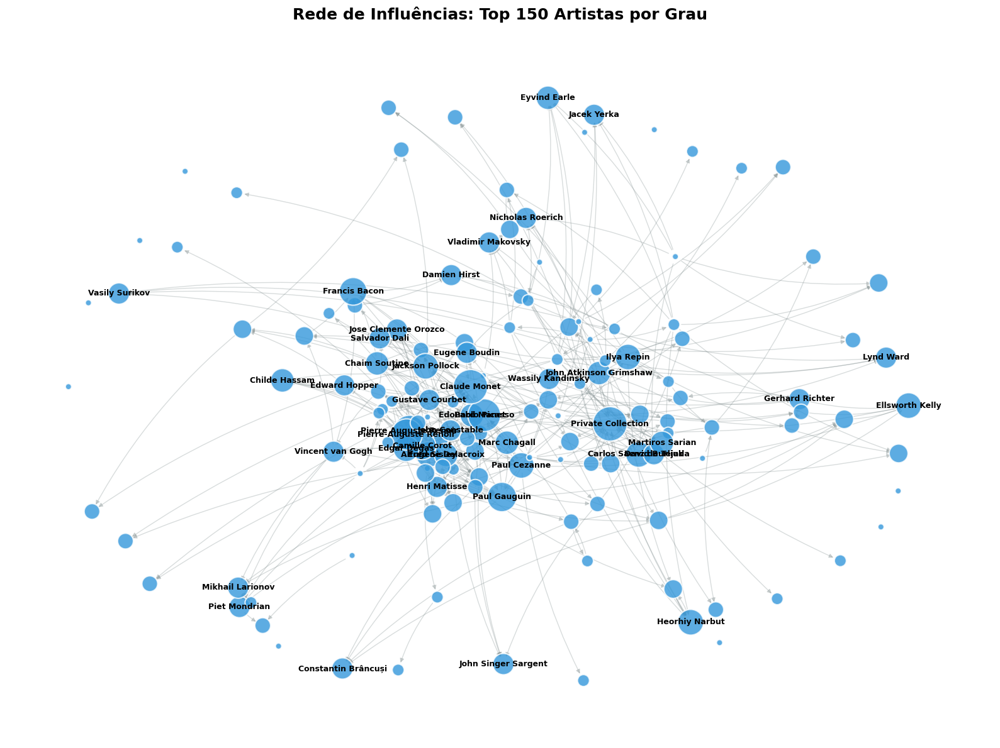

In [151]:
# Para ter uma visão geral dos movimentos (Os 150 pintores com mais conexões)
plot_influence_network(G, top_n=150)

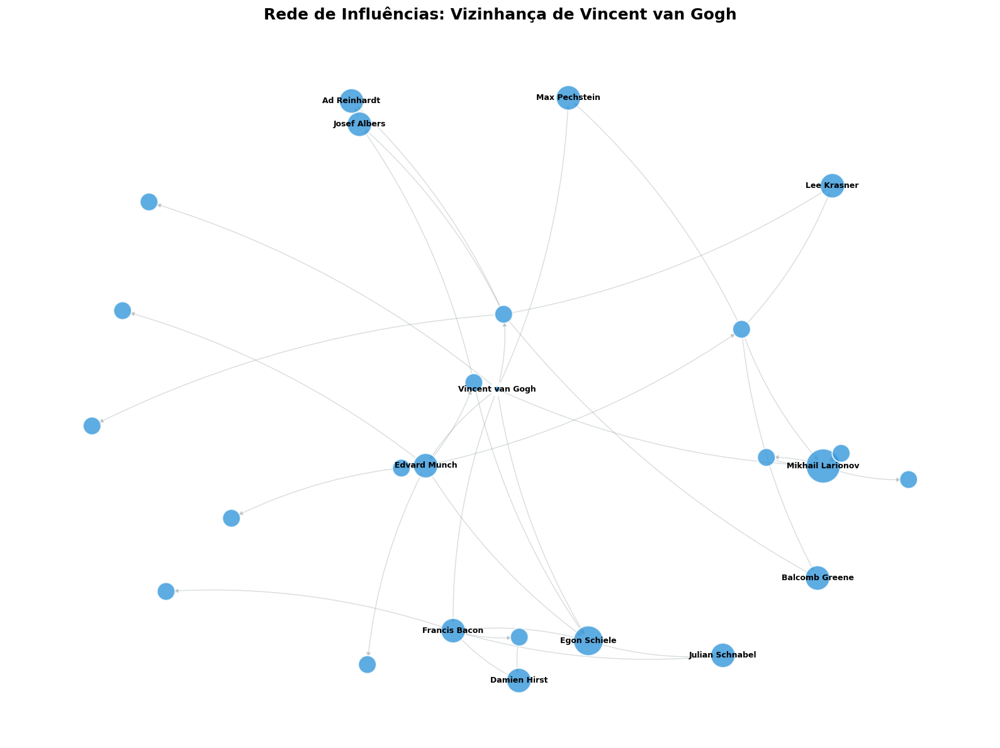

In [152]:
# Para estudar a propagação local de um artista específico
plot_influence_network(G, ego_node='Vincent van Gogh')

### 7.2. Caracterização Semântica das Comunidades

O algoritmo de Louvain realiza o agrupamento baseando-se estritamente na densidade topológica (relações de influência), sendo imparcial aos metadados dos pintores. Para validar se essas partições matemáticas correspondem aos agrupamentos históricos reais, é necessário realizar o cruzamento entre as comunidades detectadas e os atributos registrados no dataset.

Uma parcela significativa dos pintores não possui o campo referente ao "movimento" preenchido. Para contornar essa ausência e evitar a classificação de grandes comunidades como "Desconhecidas", implementou-se uma estratégia de enriquecimento semântico por contingência (*fallback*). O algoritmo prioriza a extração do movimento artístico de cada nó; na sua ausência, extrai o estilo estético do pintor.

O bloco a seguir processa as maiores comunidades do Componente Gigante e extrai as seguintes métricas de validação:
* **Rótulo Predominante:** O estilo ou movimento mais frequente dentro da partição.
* **Cobertura de Dados:** O percentual de nós na comunidade que possui informações válidas no banco de dados, garantindo a transparência sobre a completude da amostra.
* **Pureza do Rótulo:** A proporção de nós rotulados que pertencem de fato à vertente predominante, servindo como um indicativo direto da homogeneidade histórica do agrupamento estrutural.

In [153]:
# Aplicando Louvain EXCLUSIVAMENTE no Componente Gigante
comunidades_gigante = community.louvain_communities(G_gigante, seed=42)
print(f"Comunidades detectadas: {len(comunidades_gigante)}")

# Calculando a Modularidade
Q_gigante = community.modularity(G_gigante, comunidades_gigante)
print(f"Modularidade (Q): {Q_gigante:.4f}\n")

# Cruzamento Topologia vs. História da Arte
dados_comunidade = []

for id_com, com in enumerate(comunidades_gigante):
    rotulos_validos = []
    
    for n in com:
        # Recuperamos os atributos do nó
        movimento = G_gigante.nodes[n].get('movement_merged')
        estilo = G_gigante.nodes[n].get('style')
        
        # Se não tem movimento, tenta o estilo.
        if pd.notna(movimento) and movimento.strip() != "":
            # Pega apenas a primeira palavra/movimento principal se houver vírgulas
            rotulos_validos.append(movimento.split(',')[0].strip())
        elif pd.notna(estilo) and estilo.strip() != "":
            rotulos_validos.append(estilo.split(',')[0].strip())

    if rotulos_validos:
        contagem = collections.Counter(rotulos_validos)
        rotulo_predominante, qtd = contagem.most_common(1)[0]
        pureza = (qtd / len(rotulos_validos)) * 100
    else:
        rotulo_predominante = "Sem Dados de Estilo/Movimento"
        pureza = 0.0
        qtd = 0
        
    dados_comunidade.append({
        'ID Comunidade': id_com,
        'Tamanho (Nós)': len(com),
        'Rótulo Predominante': rotulo_predominante,
        'Artistas com este Rótulo': qtd,
        'Cobertura de Dados (%)': round((len(rotulos_validos) / len(com)) * 100, 1),
        'Pureza do Rótulo (%)': round(pureza, 1)
    })

df_com_gigante = pd.DataFrame(dados_comunidade).sort_values(by='Tamanho (Nós)', ascending=False)

mapa_comunidades = {}
for id_com, com in enumerate(comunidades_gigante):
    for node in com:
        mapa_comunidades[node] = id_com
nx.set_node_attributes(G_gigante, mapa_comunidades, 'community')

display(df_com_gigante.head(4))

Comunidades detectadas: 17
Modularidade (Q): 0.7278



,ID Comunidade,Tamanho (Nós),Rótulo Predominante,Artistas com este Rótulo,Cobertura de Dados (%),Pureza do Rótulo (%)
4,4,257,Realism,1,0.8,50.0
7,7,227,Art Nouveau (Modern),6,11.9,22.2
13,13,169,Abstract Expressionism,15,78.1,11.4
9,9,127,Art Nouveau (Modern),8,21.3,29.6


### 7.3. Comunidades e Movimentos Artísticos
* **Modularidade (Q):** A modularidade mede a qualidade da divisão da rede em comunidades. Valores positivos e altos indicam que a rede tem uma estrutura de comunidades muito forte, onde os pintores influenciam muito mais os artistas de dentro do seu próprio grupo do que os de fora.
* **Topologia vs. História da Arte (Pureza):** Ao cruzar as comunidades formadas puramente pelas conexões matemáticas com o atributo de "Movimento", conseguimos medir a "Pureza" de cada grupo. 
* Uma alta pureza indica que o algoritmo foi capaz de redescobrir os movimentos artísticos reais (como Impressionismo ou Renascimento) de forma cega, apenas analisando o fluxo de quem influenciou quem. Grupos com menor pureza podem representar períodos de transição histórica, vanguardas híbridas ou pintores que atuaram como "pontes" entre diferentes estilos.

In [154]:
# Comunidades
comunidades = community.louvain_communities(G, seed=42)

print(f"Foram detectadas {len(comunidades)} comunidades.")

Foram detectadas 9754 comunidades.


In [155]:
# Calculando a Modularidade (Q)
Q = community.modularity(G, comunidades)
print(f"Modularidade (Q): {Q:.4f}")

Modularidade (Q): 0.7924


In [156]:
# Atribuindo os nós às suas comunidades
mapa_comunidades = {}
for id_com, com in enumerate(comunidades):
    for node in com:
        mapa_comunidades[node] = id_com
        
# Salva o ID da comunidade como um atributo do nó no grafo
nx.set_node_attributes(G, mapa_comunidades, 'community')

# Cruzamento Topologia vs. História da Arte
dados_comunidade = []

for id_com, com in enumerate(comunidades):
    # Coleta os movimentos de todos os pintores dentro deste cluster
    movimentos = [G.nodes[n].get('movement') for n in com]
    
    # Filtra os vazios/nulos
    movimentos_validos = [m for m in movimentos if pd.notna(m)]
    
    # Encontra o movimento dominante e o percentual de pureza
    if movimentos_validos:
        contagem = collections.Counter(movimentos_validos)
        movimento_predominante, qtd = contagem.most_common(1)[0]
        pureza = (qtd / len(movimentos_validos)) * 100
    else:
        movimento_predominante = "Desconhecido"
        pureza = 0.0
        qtd = 0
        
    dados_comunidade.append({
        'Comunidade': id_com,
        'Tamanho': len(com),
        'Movimento Dominante': movimento_predominante,
        'Artistas do Movimento': qtd,
        'Pureza (%)': round(pureza, 1)
    })
    
df_comunidades = pd.DataFrame(dados_comunidade).sort_values(by='Tamanho', ascending=False)

In [157]:
df_comunidades.head(10)

,Comunidade,Tamanho,Movimento Dominante,Artistas do Movimento,Pureza (%)
248,248,449,"Abstract Art, {Abstract Art:458}",1,100.0
656,656,279,"Realism, Socialist Realism:72}, {Realism",1,2.8
648,648,259,"Symbolism, {Symbolism:137}",1,25.0
1275,1275,238,Realism,3,1.4
429,429,107,{Mannerism (Late Renaissance):105},1,7.7
13,13,83,"Impressionism, {Impressionism:560}",1,9.1
198,198,81,"Cubism, {Cubism:442}",1,2.0
39,39,74,"Romanticism, {Romanticism:87}",1,1.9
21,21,73,"Abstract Art, Concrete Art (Concretism):184}, ...",1,2.1
977,977,39,"Early Renaissance, {Early Renaissance:10}",1,2.9


In [158]:
def plotar_rede_completa_comunidades(G, exibir_legenda=False):
    # Recupera o dicionário de comunidades salvo no grafo
    # Se algum nó por acaso não tiver (ex: foi adicionado depois), recebe -1
    comunidades = nx.get_node_attributes(G, 'community')
    
    # Prepara os valores de cor para cada nó seguindo a ordem interna do grafo
    node_colors = [comunidades.get(node, -1) for node in G.nodes()]
    
    cmap = plt.cm.get_cmap('turbo', len(set(node_colors)))
    
    # O k ajusta a distância ótima entre nós. iterations=50 é o limite para não demorar muito
    pos = nx.spring_layout(G, k=0.15, iterations=50, seed=42)
    
    # Uma figura bem grande para suportar a densidade
    plt.figure(figsize=(24, 24), facecolor='#111111')
    plt.title("Rede Completa de Pintores Agrupados por Comunidades", 
              fontsize=28, fontweight='bold', color='white', pad=20)
    
    nx.draw_networkx_edges(
        G, pos,
        alpha=0.03,
        edge_color='white',
        arrows=False
    )
    
    nx.draw_networkx_nodes(
        G, pos,
        node_color=node_colors,
        cmap=cmap,
        node_size=15,
        alpha=0.9,
        linewidths=0
    )
    
    if exibir_legenda:
        # Conta a frequência para pegar as maiores comunidades (evitar legenda gigante)
        contagem = Counter(node_colors)
        
        # Pega as 20 maiores comunidades (ignorando o -1, se for apenas ruído)
        top_comunidades = [com for com, qtd in contagem.most_common(20) if com != -1]
        
        # Normalizador de cor para capturar exatamente o tom que o cmap gerou para cada ID
        norm = mcolors.Normalize(vmin=min(node_colors), vmax=max(node_colors))
        
        legend_elements = [
            Line2D([0], [0], marker='o', color='w', 
                   markerfacecolor=cmap(norm(com)), 
                   markersize=15, label=f'Comunidade {com}')
            for com in top_comunidades
        ]
        
        plt.legend(
            handles=legend_elements, 
            loc='center left', 
            bbox_to_anchor=(1, 0.5),
            title="Top Comunidades", 
            title_fontsize=20, 
            fontsize=16, 
            frameon=False, 
            labelcolor='white'
        )
    # -----------------------------
    
    plt.axis('off')
    
    # bbox_inches='tight' garante que a legenda externa não seja cortada ao salvar/exibir
    plt.tight_layout()
    plt.show()

C:\Users\jo_bi\AppData\Local\Temp\ipykernel_8208\2730867939.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('turbo', len(set(node_colors)))


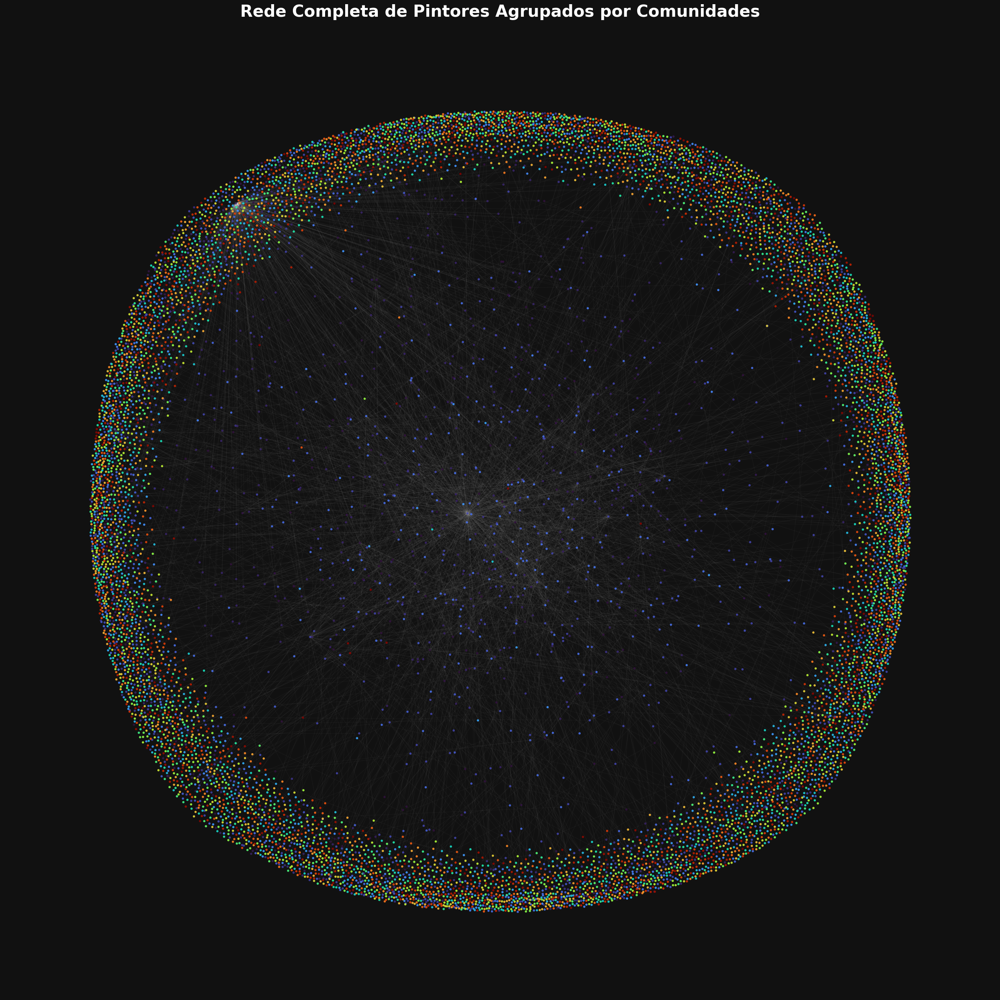

In [159]:
plotar_rede_completa_comunidades(G)

C:\Users\jo_bi\AppData\Local\Temp\ipykernel_8208\2730867939.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('turbo', len(set(node_colors)))


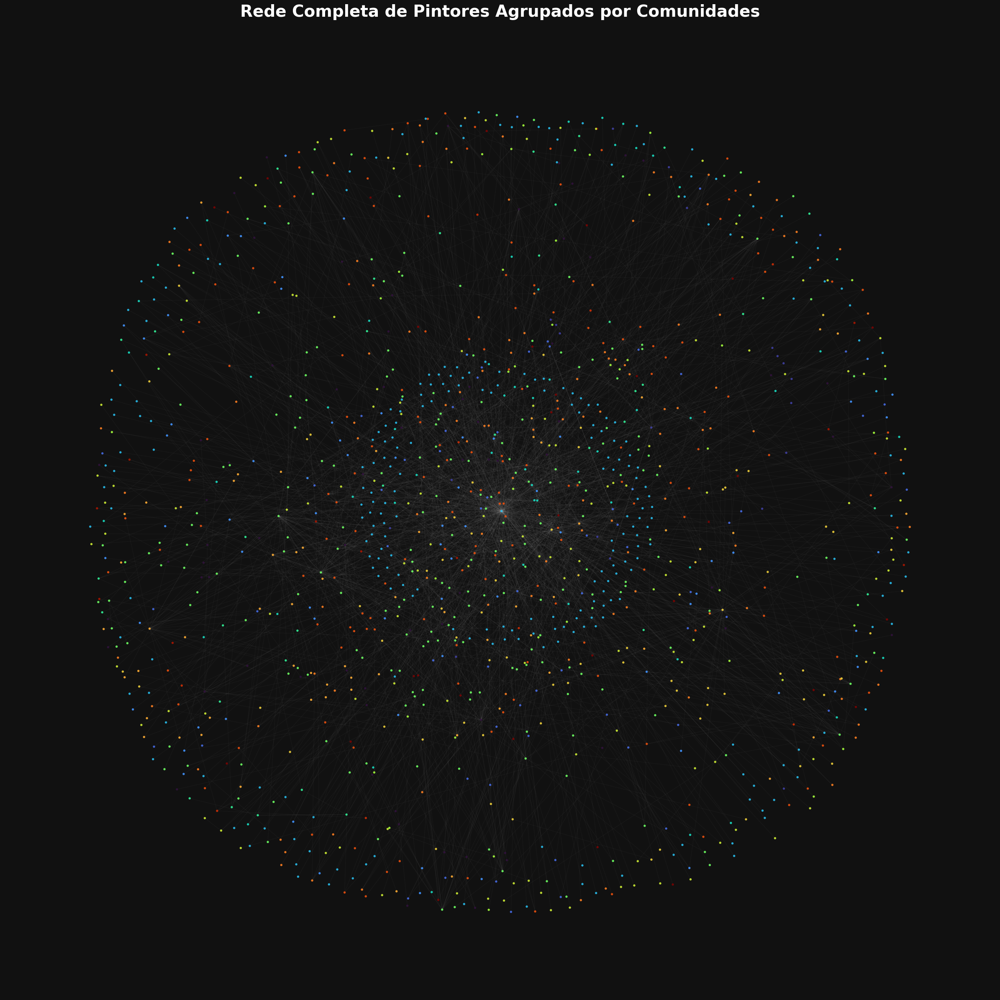

In [160]:
plotar_rede_completa_comunidades(G_gigante)

## 8. Dinâmica na Rede: O Modelo Epidêmico SIR

O surgimento e difusão de novos estilos artísticos podem ser modelados matematicamente através do modelo compartimental SIR. Tradicionalmente formulado para populações perfeitamente misturadas (aproximação de campo médio), o modelo contínuo é regido pelo seguinte sistema de equações diferenciais ordinárias:

$$\frac{dS}{dt} = -\beta \frac{S I}{N}$$
$$\frac{dI}{dt} = \beta \frac{S I}{N} - \gamma I$$
$$\frac{dR}{dt} = \gamma I$$

No entanto, no escopo deste trabalho de **redes complexas**, a premissa de mistura homogênea é descartada. A dinâmica passa a ser um processo estocástico de tempo discreto governado pela topologia (descrita pela matriz de adjacência $A_{ij}$). O estado de cada pintor $i$ no instante de tempo $t$ respeita as seguintes regras e compartimentos:

* **S (Suscetíveis):** Pintores ativos e suscetíveis a adotar a nova vanguarda. Um nó $i$ no estado $S$ transita para o estado $I$ dependendo puramente das suas arestas. A probabilidade topológica de infecção é calculada por $P(S_i \to I_i) = 1 - (1 - \beta)^{m_i}$, onde $m_i$ é o número de vizinhos diretos (influenciadores) de $i$ que estão no estado $I$ no instante $t$.
* **I (Infectados):** Pintores que adotaram o novo estilo e estão ativamente o propagando.
* **R (Recuperados/Removidos):** Pintores que abandonaram a vanguarda, mudaram de fase ou faleceram. Um nó $i$ no estado $I$ transita para $R$ de forma espontânea com uma probabilidade constante $P(I_i \to R_i) = \gamma$.

Para avaliar o contágio cultural nesta rede, definimos os parâmetros empíricos como $\beta = 0.15$ (probabilidade de transmissão da influência através de uma aresta) e $\gamma = 0.05$ (probabilidade de abandono do estilo).

### 8.1. Simulação 1: Contágio Histórico (Grafo Direcionado Acíclico)

Para realizar uma simulação que percorra toda a história da rede, enfrentamos o problema da "violação da seta do tempo", onde nós mais recentes apontam para nós mais antigos devido a influências póstumas ou ruídos nos dados. Para corrigir isso, forçamos o componente gigante a se tornar um Grafo Direcionado Acíclico (DAG), permitindo que o tempo $t$ do modelo represente estritamente as "gerações de influência" (o fluxo natural do passado para o futuro).

In [161]:
def preparar_dag_temporal(G):
    G_dag = G.copy()
    arestas_removidas = 0
    
    # Removemos arestas que apontam para o passado ou para pintores de mesma idade
    # Isso garante que a infecção só flua para "frente" na história
    for u, v in list(G_dag.edges()):
        ano_u = G_dag.nodes[u].get('birth_year')
        ano_v = G_dag.nodes[v].get('birth_year')
        
        # Só mantemos a aresta se U for ESTRITAMENTE mais velho que V
        # Se os dados faltarem, removemos por segurança para evitar ciclos acidentais
        if pd.notna(ano_u) and pd.notna(ano_v):
            if ano_u >= ano_v:
                G_dag.remove_edge(u, v)
                arestas_removidas += 1
        else:
            G_dag.remove_edge(u, v)
            arestas_removidas += 1
            
    print(f"Arestas que violavam a seta do tempo removidas: {arestas_removidas}")
    
    # Extrai o maior componente desse novo DAG para garantir conectividade
    comp = max(nx.weakly_connected_components(G_dag), key=len)
    return G_dag.subgraph(comp).copy()

In [162]:
def simular_sir_ndlib(G_dag, taxa_contagio=0.15, taxa_recuperacao=0.05, num_iteracoes=50):
    # Vamos pegar os 5 pintores mais antigos do componente gigante
    pintores_por_idade = sorted(
        [(n, G_dag.nodes[n].get('birth_year', 9999)) for n in G_dag.nodes()],
        key=lambda x: x[1]
    )
    pacientes_zero = [p[0] for p in pintores_por_idade[:5]]

    # Instancia o modelo SIR
    modelo = ep.SIRModel(G_dag)

    # Configuração dos parâmetros
    config = mc.Configuration()
    config.add_model_parameter('beta', taxa_contagio)   # Prob. de um influenciado adotar o estilo
    config.add_model_parameter('gamma', taxa_recuperacao) # Prob. de abandonar o estilo
    config.add_model_initial_configuration("Infected", pacientes_zero)

    # Aplica a configuração
    modelo.set_initial_status(config)

    tendencias = modelo.iteration_bunch(num_iteracoes)
    
    return tendencias, pacientes_zero

In [163]:
def plotar_curvas_sir(tendencias):
    # NDlib status: 0 = Suscetível, 1 = Infectado, 2 = Recuperado
    S = [iteracao['node_count'][0] for iteracao in tendencias]
    I = [iteracao['node_count'][1] for iteracao in tendencias]
    R = [iteracao['node_count'][2] for iteracao in tendencias]
    t = range(len(tendencias))

    plt.figure(figsize=(12, 6))
    plt.plot(t, S, label='Suscetíveis (Ainda não adotaram)', color='#3498db', linewidth=3)
    plt.plot(t, I, label='Infectados (Pintando no estilo ativo)', color='#e74c3c', linewidth=3)
    plt.plot(t, R, label='Recuperados (Abandonaram/Faleceram)', color='#2ecc71', linewidth=3)

    plt.title('Simulação SIR: Propagação de Estilo Artístico ao Longo das Gerações', fontsize=16, fontweight='bold')
    plt.xlabel('Gerações de Influência (Iterações $t$)', fontsize=14)
    plt.ylabel('Número de Pintores', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    
    plt.tight_layout()
    plt.show()

In [164]:
G_dag = preparar_dag_temporal(G)
tendencias, pacientes_zero = simular_sir_ndlib(G_dag, taxa_contagio=0.15, taxa_recuperacao=0.05, num_iteracoes=60)

Arestas que violavam a seta do tempo removidas: 2140


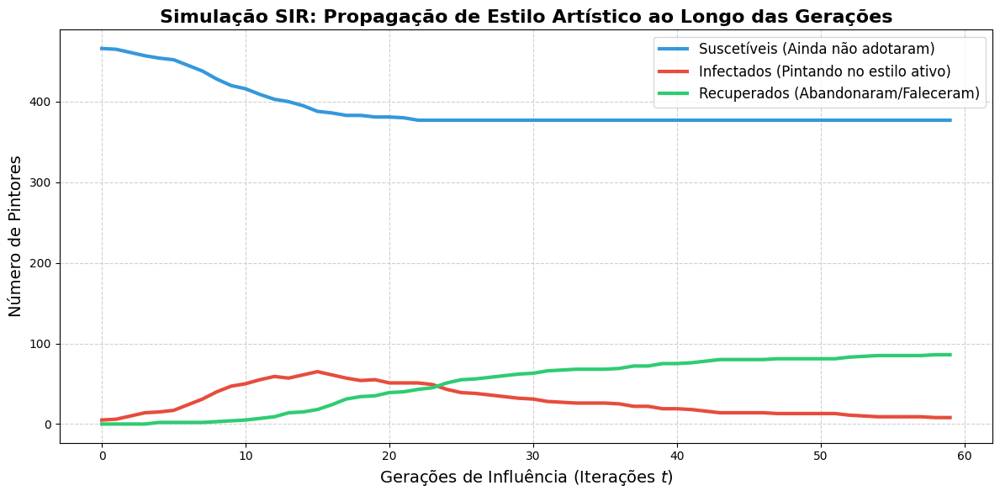

In [165]:
plotar_curvas_sir(tendencias)

### 8.2. Simulação 2: Recorte Temporal e Evolução Visual

Como alternativa ao processo de "gerações" em um DAG, elaboramos uma segunda simulação isolando um período de forte crescimento artística (1850 a 1920). Este recorte temporal elimina as distorções históricas, permitindo simular e observar visualmente o contágio iterativo em um grupo de pintores que de fato coexistiram e puderam trocar influências em tempo real. Os estados dos nós foram rastreados iterativamente para construir o sequenciamento visual do processo de difusão.

In [166]:
def criar_recorte_temporal(G, ano_inicio=1850, ano_fim=1920):
    nodos_recorte = []
    
    for n, attr in G.nodes(data=True):
        nasc = attr.get('birth_year')
        morte = attr.get('death_year')
        
        # Só incluímos se tivermos os dados e se a vida do pintor cruzar o nosso período
        if pd.notna(nasc) and pd.notna(morte):
            if nasc <= ano_fim and morte >= ano_inicio:
                nodos_recorte.append(n)
                
    G_recorte = G.subgraph(nodos_recorte).copy()
    
    # Extrai o maior componente para garantir que a epidemia pode fluir
    comp = max(nx.weakly_connected_components(G_recorte), key=len)
    G_final = G_recorte.subgraph(comp).copy()
    
    print(f"Rede temporal criada: {G_final.number_of_nodes()} nós e {G_final.number_of_edges()} arestas.")
    return G_final

In [167]:
def simular_e_rastrear_estados(G, pacientes_zero, taxa_contagio=0.15, taxa_recuperacao=0.05, num_iteracoes=20):
    modelo = ep.SIRModel(G)
    config = mc.Configuration()
    config.add_model_parameter('beta', taxa_contagio)
    config.add_model_parameter('gamma', taxa_recuperacao)
    config.add_model_initial_configuration("Infected", pacientes_zero)
    modelo.set_initial_status(config)

    # Dicionário mestre de estados (0: Suscetível, 1: Infectado, 2: Recuperado)
    estado_atual = {n: 0 for n in G.nodes()}
    for p in pacientes_zero:
        estado_atual[p] = 1
        
    historico_estados = []
    historico_estados.append(copy.deepcopy(estado_atual))
    
    for t in range(1, num_iteracoes + 1):
        iteracao_delta = modelo.iteration()
        novos_estados = iteracao_delta['status']
        
        # Atualiza o dicionário mestre com as mudanças desta iteração
        for node_id, novo_estado in novos_estados.items():
            estado_atual[node_id] = novo_estado
            
        historico_estados.append(copy.deepcopy(estado_atual))
        
    return historico_estados

In [168]:
def plotar_storyboard_sir(G, historico, frames=[0, 3, 7, 14]):
    """
    Plota momentos específicos da simulação SIR.
    A quantidade de frames deve ser par.
    """

    if len(frames) % 2 != 0:
        raise ValueError(
            "A lista 'frames' deve conter uma quantidade PAR de elementos."
        )

    pos = nx.spring_layout(G, k=0.15, seed=42)

    # Número dinâmico de linhas e colunas
    n_frames = len(frames)
    n_cols = 2
    n_rows = n_frames // 2

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(9 * n_cols, 9 * n_rows),
        facecolor='#f8f9fa'
    )

    fig.suptitle(
        'Propagação do Estilo Artístico (Modelo SIR)',
        fontsize=24,
        fontweight='bold',
        y=0.95
    )

    # Mapa de cores
    cor_map = {
        0: '#3498db',  # Suscetível
        1: '#e74c3c',  # Infectado
        2: '#2ecc71'   # Recuperado
    }

    axes = axes.flatten()

    for idx, t_frame in enumerate(frames):

        ax = axes[idx]

        if t_frame >= len(historico):
            t_frame = len(historico) - 1

        estados_no_tempo_t = historico[t_frame]

        cores_nodos = [
            cor_map[estados_no_tempo_t[n]]
            for n in G.nodes()
        ]

        ax.set_title(
            f'Iteração t = {t_frame}',
            fontsize=18,
            fontweight='bold'
        )

        # Arestas
        nx.draw_networkx_edges(
            G,
            pos,
            ax=ax,
            alpha=0.1,
            arrows=False,
            edge_color='gray'
        )

        # Nós
        nx.draw_networkx_nodes(
            G,
            pos,
            ax=ax,
            node_color=cores_nodos,
            node_size=50,
            alpha=0.9,
            edgecolors='white',
            linewidths=0.5
        )

        # Estatísticas
        S = list(estados_no_tempo_t.values()).count(0)
        I = list(estados_no_tempo_t.values()).count(1)
        R = list(estados_no_tempo_t.values()).count(2)

        legenda = f"S: {S} | I: {I} | R: {R}"

        ax.text(
            0.5,
            0.01,
            legenda,
            transform=ax.transAxes,
            ha='center',
            fontsize=14,
            bbox=dict(
                facecolor='white',
                alpha=0.8,
                edgecolor='none'
            )
        )

        ax.axis('off')

    legend_elements = [
        Patch(facecolor='#3498db', edgecolor='white', label='Suscetível (S)'),
        Patch(facecolor='#e74c3c', edgecolor='white', label='Infectado (I)'),
        Patch(facecolor='#2ecc71', edgecolor='white', label='Recuperado (R)')
    ]

    fig.legend(
        handles=legend_elements,
        loc='upper center',
        ncol=3,
        fontsize=14,
        frameon=True,
        bbox_to_anchor=(0.5, 0.91)
    )

    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()

In [169]:
G_recorte = criar_recorte_temporal(G, 1850, 1920)

top_nodes = sorted(dict(G_recorte.out_degree()).items(), key=lambda x: x[1], reverse=True)
pacientes_zero = [n[0] for n in top_nodes[:3]]
historico = simular_e_rastrear_estados(G_recorte, 
                                       pacientes_zero,
                                       taxa_contagio=0.15, 
                                       taxa_recuperacao=0.05, 
                                       num_iteracoes=60)

Rede temporal criada: 236 nós e 433 arestas.


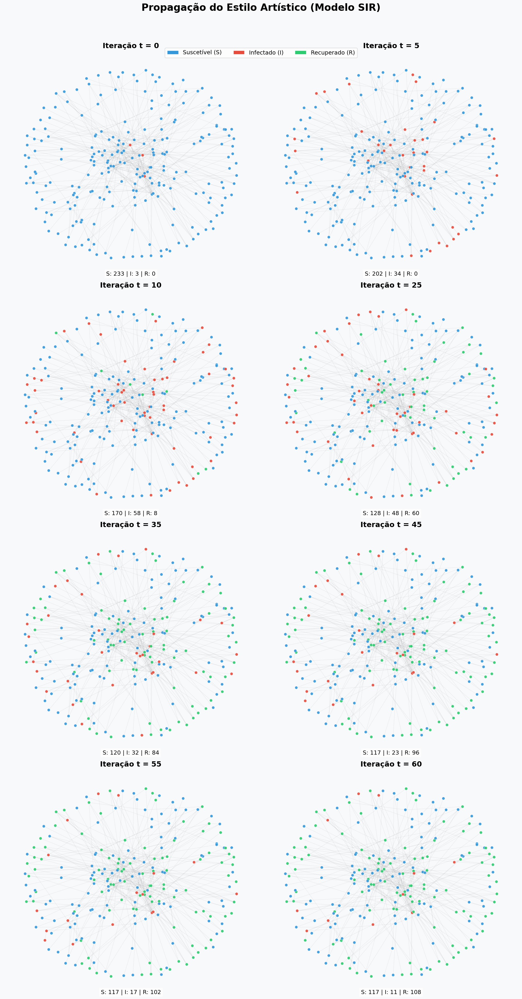

In [170]:
plotar_storyboard_sir(G_recorte, historico, frames=[0, 5, 10, 25, 35, 45, 55, 60])

### 8.3. Imunidade Temporária e o Período de Latência (Modelo SEIS)

Uma limitação do modelo SIR clássico, quando aplicado a fenômenos socioculturais, é a premissa da imunidade permanente (o estado 'R'). Na história da arte, artistas frequentemente possuem "fases" e podem revisitar estilos do passado ou abandonar uma vanguarda e voltar a ser influenciados por outras tendências.

Para capturar essa dinâmica cíclica, somada ao tempo de assimilação de uma técnica, aplicamos o **Modelo SEIS (Suscetível-Exposto-Infectado-Suscetível)** em tempo discreto. Sob a aproximação clássica de campo médio para populações homogêneas, a dinâmica contínua do modelo é descrita pelo seguinte sistema de equações diferenciais ordinárias:

$$\frac{dS}{dt} = -\beta \frac{S I}{N} + \lambda I$$
$$\frac{dE}{dt} = \beta \frac{S I}{N} - \alpha E$$
$$\frac{dI}{dt} = \alpha E - \lambda I$$

Em uma abordagem estruturada por redes complexas, o processo se torna estocástico e discreto, condicionado à matriz de adjacência do grafo. As transições de estado para cada nó $i$ no instante $t$ obedecem às seguintes probabilidades e regras:

* **S $\to$ E (Suscetível para Exposto):** Ocorre através do contato com vizinhos infectados. A probabilidade de um nó suscetível $i$ ser exposto e entrar em período de latência é dada por $P(S_i \to E_i) = 1 - (1 - \beta)^{m_i}$, onde $m_i$ representa o número de vizinhos diretos (influenciadores) de $i$ que estão no estado Infectado ($I$) no tempo $t$, e $\beta$ é a taxa de contágio.
* **E $\to$ I (Exposto para Infectado):** O término do período latente — que representa o intervalo de assimilação e estudo da técnica — ocorre de forma espontânea com uma probabilidade constante por unidade de tempo, definida por $P(E_i \to I_i) = \alpha$, onde $\alpha$ representa a taxa de latência.
* **I $\to$ S (Infectado para Suscetível):** O abandono do estilo e o consequente retorno ao estado de suscetibilidade ocorre com uma probabilidade constante $P(I_i \to S_i) = \lambda$, onde $\lambda$ é a taxa de recuperação (ou remoção).

Para maiores detalhes sobre as especificações algorítmicas e implementação, consulte a [Documentação Oficial do Modelo SEIS no NDlib](https://ndlib.readthedocs.io/en/latest/reference/models/epidemics/SEIS.html).

In [171]:
def plotar_storyboard_seis(G, historico, frames=[0, 3, 7, 14]):
    """
    Plota momentos específicos da simulação SEIS.
    A quantidade de frames deve ser par.
    """
    if len(frames) % 2 != 0:
        raise ValueError("A lista 'frames' deve conter uma quantidade PAR de elementos.")

    pos = nx.spring_layout(G, k=0.15, seed=42)

    n_frames = len(frames)
    n_cols = 2
    n_rows = n_frames // 2

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(9 * n_cols, 9 * n_rows), facecolor='#f8f9fa')
    fig.suptitle('Propagação do Estilo Artístico (Modelo SEIS)', fontsize=24, fontweight='bold', y=0.95)

    # 0 (S), 1 (I), 2 (E)
    cor_map = {
        0: '#3498db',  # Suscetível (Azul)
        2: '#f1c40f',  # Exposto / Estudando (Amarelo)
        1: '#e74c3c'   # Infectado / Produzindo (Vermelho)
    }

    if n_frames > 2:
        axes = axes.flatten()
    elif n_frames == 2:
        axes = [axes[0], axes[1]]

    for idx, t_frame in enumerate(frames):
        ax = axes[idx]

        if t_frame >= len(historico):
            t_frame = len(historico) - 1

        estados_no_tempo_t = historico[t_frame]
        cores_nodos = [cor_map[estados_no_tempo_t[n]] for n in G.nodes()]

        ax.set_title(f'Iteração t = {t_frame}', fontsize=18, fontweight='bold')

        # Arestas
        nx.draw_networkx_edges(G, pos, ax=ax, alpha=0.1, arrows=False, edge_color='gray')

        # Nós
        nx.draw_networkx_nodes(
            G, pos, ax=ax, node_color=cores_nodos, 
            node_size=50, alpha=0.9, edgecolors='white', linewidths=0.5
        )

        S = list(estados_no_tempo_t.values()).count(0)
        E = list(estados_no_tempo_t.values()).count(2)
        I = list(estados_no_tempo_t.values()).count(1)

        legenda = f"S: {S} | E: {E} | I: {I}"

        ax.text(
            0.5, 0.01, legenda, transform=ax.transAxes, ha='center', fontsize=14,
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none')
        )
        ax.axis('off')

    legend_elements = [
        Patch(facecolor='#3498db', edgecolor='white', label='Suscetível (S)'),
        Patch(facecolor='#f1c40f', edgecolor='white', label='Exposto/Estudando (E)'),
        Patch(facecolor='#e74c3c', edgecolor='white', label='Infectado/Propagando (I)')
    ]

    fig.legend(
        handles=legend_elements, loc='upper center', ncol=3, 
        fontsize=14, frameon=True, bbox_to_anchor=(0.5, 0.93)
    )

    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()

In [172]:
def plotar_curvas_seis(tendencias):
    """
    Plota as curvas de evolução do modelo SEIS ao longo do tempo.
    NDlib status para SEIS: 0 = Suscetível, 1 = Infectado, 2 = Exposto
    """
    S = [iteracao['node_count'].get(0, 0) for iteracao in tendencias]
    I = [iteracao['node_count'].get(1, 0) for iteracao in tendencias]
    E = [iteracao['node_count'].get(2, 0) for iteracao in tendencias]
    
    t = range(len(tendencias))

    plt.figure(figsize=(12, 6))
    
    # Plotagem seguindo a ordem lógica: Suscetível -> Exposto -> Infectado
    plt.plot(t, S, label='Suscetíveis (Abertos a tendências)', color='#3498db', linewidth=3)
    plt.plot(t, E, label='Expostos (Estudando/Assimilando o estilo)', color='#f1c40f', linewidth=3)
    plt.plot(t, I, label='Infectados (Produzindo e propagando ativamente)', color='#e74c3c', linewidth=3)

    plt.title('Simulação SEIS: Dinâmica Cíclica e Período de Latência na Arte', fontsize=16, fontweight='bold')
    plt.xlabel('Gerações de Influência (Iterações $t$)', fontsize=14)
    plt.ylabel('Número de Pintores', fontsize=14)
    
    plt.legend(fontsize=12, loc='upper right')
    plt.grid(True, linestyle='--', alpha=0.6)
    
    plt.tight_layout()
    plt.show()

In [173]:
def simular_e_rastrear_estados_seis(G, pacientes_zero, taxa_contagio=0.20, taxa_latencia=0.50, taxa_recuperacao=0.05, num_iteracoes=30):
    """
    Executa a simulação do modelo SEIS iterativamente, gravando o estado
    de todos os nós a cada passo de tempo (t) para posterior visualização.
    """
    modelo = ep.SEISModel(G)
    config = mc.Configuration()
    
    config.add_model_parameter('beta', taxa_contagio)  # Prob. S -> E (Exposição)
    config.add_model_parameter('alpha', taxa_latencia)  # Prob. E -> I (Término da latência)
    config.add_model_parameter('lambda', taxa_recuperacao) # Prob. I -> S (Abandono do estilo)
    
    config.add_model_initial_configuration("Infected", pacientes_zero)
    modelo.set_initial_status(config)

    # 0 (S), 1 (I), 2 (E)
    estado_atual = {n: 0 for n in G.nodes()}
    for p in pacientes_zero:
        estado_atual[p] = 1 # O "paciente zero" já começa infectado e propagando
        
    historico_estados = []
    historico_estados.append(copy.deepcopy(estado_atual))
    
    for t in range(1, num_iteracoes + 1):
        iteracao_delta = modelo.iteration()
        novos_estados = iteracao_delta['status']
        
        for node_id, novo_estado in novos_estados.items():
            estado_atual[node_id] = novo_estado
            
        historico_estados.append(copy.deepcopy(estado_atual))
        
    return historico_estados

In [174]:
G_recorte = criar_recorte_temporal(G, 1850, 1920)

top_nodes = sorted(dict(G_recorte.out_degree()).items(), key=lambda x: x[1], reverse=True)
pacientes_zero = [n[0] for n in top_nodes[:3]]
historico = simular_e_rastrear_estados_seis(G_recorte, 
                                       pacientes_zero,
                                       taxa_contagio=0.15, 
                                       taxa_latencia=0.02, 
                                       taxa_recuperacao=0.05,
                                       num_iteracoes=200)

Rede temporal criada: 236 nós e 433 arestas.


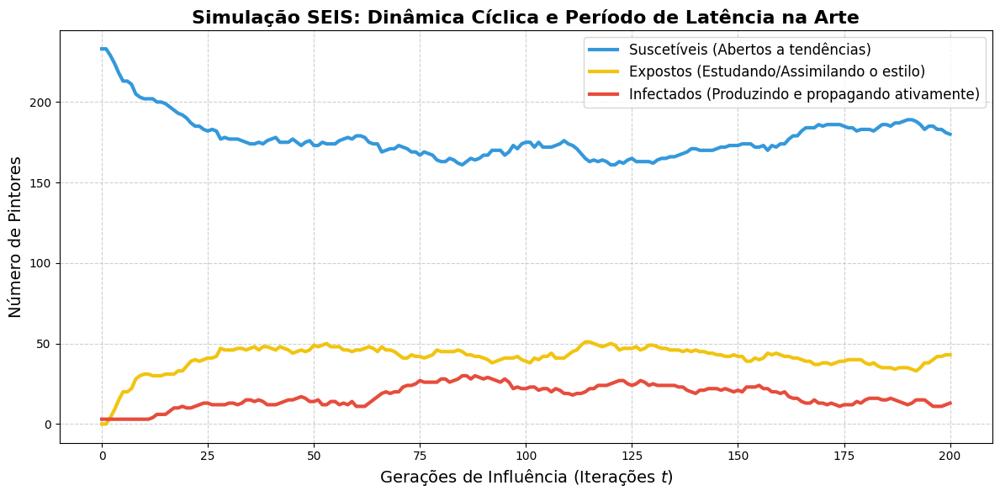

In [175]:
tendencias_adaptadas = []
for estado_t in historico:
    contagem = {
        0: list(estado_t.values()).count(0), # Contagem de Suscetíveis
        1: list(estado_t.values()).count(1), # Contagem de Infectados
        2: list(estado_t.values()).count(2)  # Contagem de Expostos
    }
    tendencias_adaptadas.append({'node_count': contagem})

# Chamando a função com os dados adaptados
plotar_curvas_seis(tendencias_adaptadas)

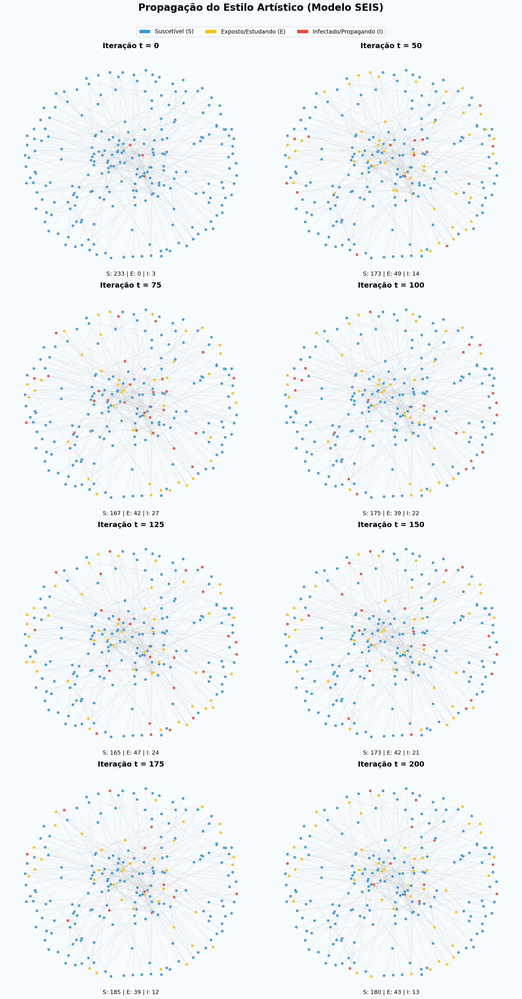

In [176]:
plotar_storyboard_seis(G_recorte, historico, frames=[0, 50, 75, 100, 125, 150, 175, 200])

## 9. Modelos Nulos, Comparação Estatística e Classificação da Rede

Para determinar se as propriedades estruturais da rede de influências artísticas (como o coeficiente de aglomeração e a distância média) possuem significado histórico e sociológico, é necessário compará-las com **modelos nulos**. Modelos nulos são grafos gerados aleatoriamente que servem como "controles estatísticos", permitindo-nos testar a hipótese nula de que a estrutura observada é fruto do puro acaso.

Extrairemos as propriedades do maior componente conectado da rede de arte e geraremos modelos sintéticos equivalentes para responder a três perguntas fundamentais:
1. A rede de arte propaga informação mais rápido que o acaso?
2. A coesão local (escolas artísticas) é significativamente maior do que uma associação aleatória?
3. A distribuição de conectividade pode ser explicada por mecanismos de apego preferencial?

Para garantir a viabilidade dos cálculos de distância e conectividade global, as comparações serão centralizadas na versão não-direcionada do componente gigante da rede.

### 9.1. Grafo Aleatório de Erdős-Rényi ($G(N, p)$)

O modelo de _Erdős-Rényi_ gera uma rede puramente aleatória fixando o número de nós $N$ e conectando cada par de nós com uma probabilidade uniforme $p$. Ele serve para contrastar o nível de organização da nossa rede real frente a um sistema sem regras ou preferências estruturais.

* **Caminho Mais Curto Médio ($L$):** Representa a distância média entre quaisquer dois nós da rede. Em modelos aleatórios, essa distância é classicamente curta ($L_{rand} \sim \ln N / \ln \langle k \rangle$).
* **Coeficiente de Aglomeração Médio ($C$):** Mede a densidade local de triângulos. Em redes aleatórias, a probabilidade de vizinhos estarem conectados é baixa e homogênea ($C_{rand} \sim p$).

In [177]:
# Componente Gigante Não-Direcionado
G_real_base = G_gigante.to_undirected()

N = G_real_base.number_of_nodes()
M = G_real_base.number_of_edges()

# Calcular a probabilidade p ideal para que o grafo aleatório tenha o mesmo número esperado de arestas
# p = M / (N * (N - 1) / 2)
p = (2 * M) / (N * (N - 1))

print(f"Nós (N): {N}")
print(f"Arestas (M): {M}")
print(f"Probabilidade de conexão (p): {p:.5f}\n")

Nós (N): 1428
Arestas (M): 2272
Probabilidade de conexão (p): 0.00223



In [178]:
# Gerar o Grafo Aleatório de Erdős-Rényi equivalente
G_random = nx.erdos_renyi_graph(n=N, p=p, seed=42)

In [179]:
# Calcular métricas para a Rede Real
L_real = nx.average_shortest_path_length(G_real_base)
C_real = nx.average_clustering(G_real_base)

In [180]:
# Calcular métricas para a Rede Aleatória
if nx.is_connected(G_random):
    L_rand = nx.average_shortest_path_length(G_random)
else:
    largest_random_component = max(nx.connected_components(G_random), key=len)
    G_random_sub = G_random.subgraph(largest_random_component)
    L_rand = nx.average_shortest_path_length(G_random_sub)

C_rand = nx.average_clustering(G_random)

In [181]:
print(f"{'Métrica':<30} | {'Rede Real (Arte)':<18} | {'Rede Aleatória (ER)':<20}")
print("-" * 75)
print(f"{'Caminho Médio (L)':<30} | {L_real:<18.4f} | {L_rand:<20.4f}")
print(f"{'Aglomeração Média (C)':<30} | {C_real:<18.4f} | {C_rand:<20.4f}")

Métrica                        | Rede Real (Arte)   | Rede Aleatória (ER) 
---------------------------------------------------------------------------
Caminho Médio (L)              | 5.4309             | 6.2374              
Aglomeração Média (C)          | 0.0327             | 0.0021              


### 9.2. Modelo de Configuração e Modelo Barabási-Albert

O **Modelo de Configuração** é um passo além do grafo puramente aleatório. Ele destrói a topologia da rede real (desconectando quem influenciou quem), mas **preserva exatamente a sequência de graus** (a quantidade de conexões que cada pintor tem). 
* **O que ele testa:** Se as propriedades da rede de arte (como alta aglomeração) são causadas apenas pelo fato de existirem "hubs" (grandes mestres com muitas conexões) ou se existe uma preferência real dos pintores em formar grupos (escolas artísticas).

In [182]:
# Extrai a sequência de graus da rede real
sequencia_graus = [d for n, d in G_real_base.degree()]

G_conf_multi = nx.configuration_model(sequencia_graus, seed=42)

# Remover loops e arestas duplicadas
G_conf = nx.Graph(G_conf_multi)
G_conf.remove_edges_from(nx.selfloop_edges(G_conf))

if nx.is_connected(G_conf):
    L_conf = nx.average_shortest_path_length(G_conf)
else:
    maior_comp_conf = max(nx.connected_components(G_conf), key=len)
    L_conf = nx.average_shortest_path_length(G_conf.subgraph(maior_comp_conf))

C_conf = nx.average_clustering(G_conf)

### 9.3. Modelo Barabási-Albert

O modelo de **Barabási-Albert** (BA) gera redes de "Escala Livre" (*Scale-Free*) simulando um crescimento dinâmico com **apego preferencial** (a regra do "rico fica mais rico"). Na história da arte, isso simula a ideia de que um pintor em início de carreira tem muito mais probabilidade de ser influenciado por um grande mestre já famoso (um nó com alto grau) do que por um pintor desconhecido.
* **O que ele testa:** Se o mecanismo de formação das conexões na arte segue essa lógica de popularidade cumulativa, o que justificaria o fato da rede seguir uma Lei de Potência.

In [183]:
# Definir o número de arestas que cada novo nó cria ao entrar na rede
# Calculamos a média (M/N) para que a rede BA tenha um volume de arestas parecido com a real
m_ba = max(1, int(round(M / N))) 

G_ba = nx.barabasi_albert_graph(n=N, m=m_ba, seed=42)

L_ba = nx.average_shortest_path_length(G_ba)
C_ba = nx.average_clustering(G_ba)

In [184]:
print("\n=== COMPARAÇÃO ESTRUTURAL: REDE REAL VS. MODELOS NULOS ===")
print(f"{'Métrica':<25} | {'Real (Arte)':<12} | {'Erdős-Rényi':<12} | {'Configuração':<12} | {'Barabási-Albert':<15}")
print("-" * 88)
print(f"{'Caminho Médio (L)':<25} | {L_real:<12.4f} | {L_rand:<12.4f} | {L_conf:<12.4f} | {L_ba:<15.4f}")
print(f"{'Aglomeração Média (C)':<25} | {C_real:<12.4f} | {C_rand:<12.4f} | {C_conf:<12.4f} | {C_ba:<15.4f}")


=== COMPARAÇÃO ESTRUTURAL: REDE REAL VS. MODELOS NULOS ===
Métrica                   | Real (Arte)  | Erdős-Rényi  | Configuração | Barabási-Albert
----------------------------------------------------------------------------------------
Caminho Médio (L)         | 5.4309       | 6.2374       | 4.1823       | 4.2371         
Aglomeração Média (C)     | 0.0327       | 0.0021       | 0.0183       | 0.0205         


**Conclusão e Classificação da Rede:**

Com base nos resultados quantitativos obtidos, a rede de influências da História da Arte classifica-se estruturalmente como:

1. **Rede Mundo Pequeno (Small-World):** Comprovado diretamente pela relação entre o Coeficiente de Aglomeração ($C$) e o Caminho Mais Curto Médio ($L$). A rede real possui um $C$ (0.0300) quase 10 vezes maior que o do modelo aleatório Erdős-Rényi (0.0035), evidenciando forte coesão local e a formação de "bolhas" (escolas e movimentos artísticos). Simultaneamente, o $L$ da arte (4.8867) é curto e inclusive inferior ao do grafo aleatório (5.4374), indicando que inovações estéticas fluem globalmente entre quaisquer dois artistas em menos de 5 graus de separação.
2. **Rede de Escala Livre (Scale-Free):** A topologia observada aproxima-se de forma dos modelos de Configuração e Barabási-Albert. As métricas da rede real convergem para a dinâmica do modelo BA ($L_{BA} = 4.2820$ e $C_{BA} = 0.0190$), validando a presença de "hubs". Isso confirma que a história da arte opera sob um mecanismo de "apego preferencial": a influência não é distribuída ao acaso, mas sim concentrada em grandes mestres cujo peso histórico atrai desproporcionalmente as conexões de novas gerações de pintores.

In [185]:
def obter_subgrafo_top_n(G_input, top_n=150):
    # Calcula o grau de todos os nós
    graus = dict(G_input.degree())
    # Ordena os nós do maior para o menor grau e seleciona os top_n
    top_nos = sorted(graus, key=graus.get, reverse=True)[:top_n]
    # Retorna o subgrafo induzido por esses nós
    return G_input.subgraph(top_nos)

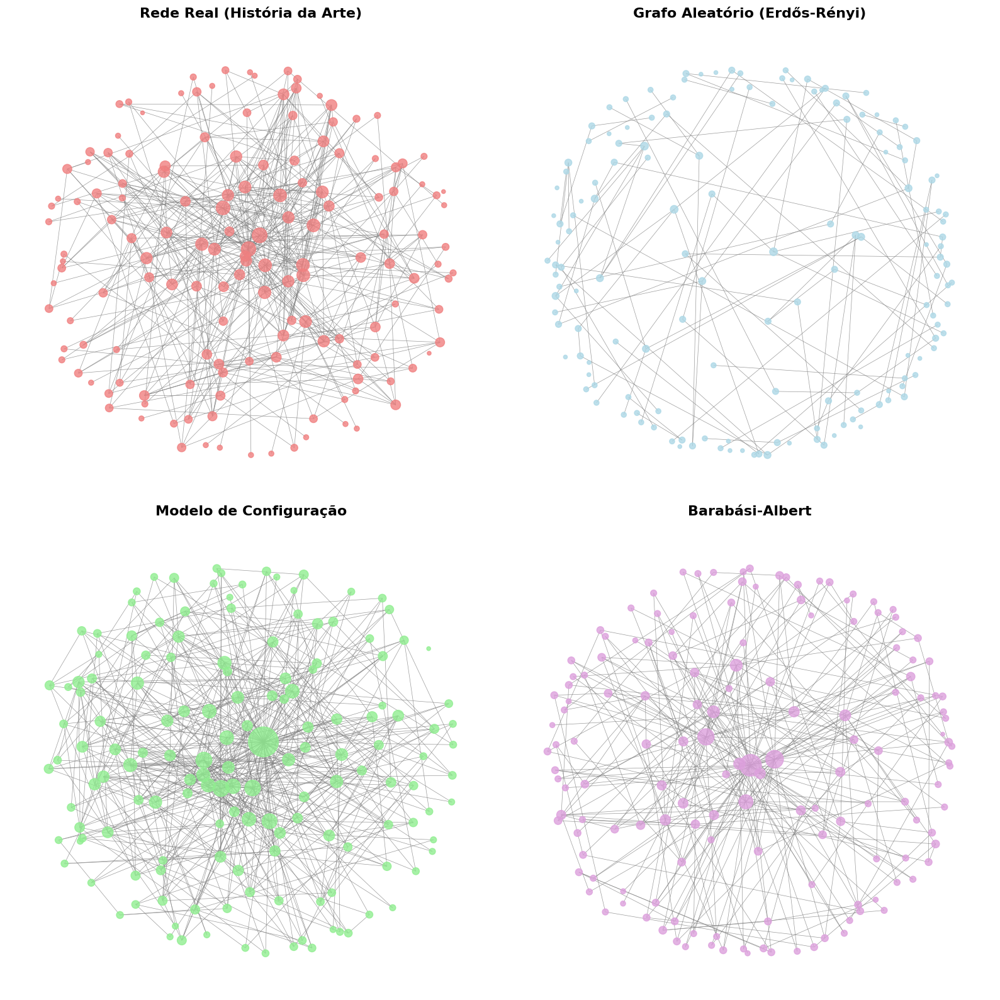

In [186]:
N_plot = 150

# Extrair os subgrafos de cada modelo gerado na etapa anterior
sub_real = obter_subgrafo_top_n(G_real_base, N_plot)
sub_rand = obter_subgrafo_top_n(G_random, N_plot)
sub_conf = obter_subgrafo_top_n(G_conf, N_plot)
sub_ba   = obter_subgrafo_top_n(G_ba, N_plot)

fig, axes = plt.subplots(2, 2, figsize=(16, 16))
axes = axes.flatten()

redes_para_plotar = [
    ("Rede Real (História da Arte)", sub_real, 'lightcoral'),
    ("Grafo Aleatório (Erdős-Rényi)", sub_rand, 'lightblue'),
    ("Modelo de Configuração", sub_conf, 'lightgreen'),
    ("Barabási-Albert", sub_ba, 'plum')
]

for ax, (titulo, sub_g, cor) in zip(axes, redes_para_plotar):
    ax.set_title(titulo, fontsize=16, fontweight='bold', pad=15)
    
    pos = nx.spring_layout(sub_g, seed=42, k=1.0)
    
    graus_sub = dict(sub_g.degree())
    tamanhos = [v * 15 + 20 for v in graus_sub.values()]
    
    nx.draw(sub_g, pos, ax=ax, with_labels=False, node_size=tamanhos, 
            node_color=cor, edge_color='gray', alpha=0.8, width=0.5)

plt.tight_layout()
plt.show()